In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os, sys
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import colormaps
from matplotlib.patches import Rectangle
import scipy.optimize as opt
from tqdm import tqdm
from matplotlib.colors import ListedColormap
from skimage import exposure
import xarray as xr


sys.path.append('../src/')
import data_utils as du
import vis_utils as vu
import analysis_utils as au

In [11]:
## Ensure to use Z-SCORED features and hypotheses for tuning surface analysis


_, __, features_nonzscored, ___ = du.load_all_data(zscore_features=False, 
                                        zscore_hypotheses=False, equalize_sentinel=True,
                                        complete_only=True, n_max_patches=100,
                                        path_folder='/Users/tplas/data/2025-10 neureo/pecl-100-subsample-30km_v2',
                                        prefix_name='pecl176-')

sentinel, sentinel_eq, features, hypotheses = du.load_all_data(zscore_features=True, 
                                        zscore_hypotheses=True, equalize_sentinel=True,
                                        complete_only=True, n_max_patches=100,
                                        path_folder='/Users/tplas/data/2025-10 neureo/pecl-100-subsample-30km_v2',
                                        prefix_name='pecl176-')
                                        # path_folder='/Users/tplas/data/2025-10 neureo/s2100k-300-random-2025-11-13',
                                        # prefix_name='s2100k-300-')
                                        # path_folder='/Users/tplas/data/2025-10 neureo/s2100k-113-indonesia-2025-11-14',
                                        # prefix_name='s2100k-100-')

N_features = features[0].shape[0]
N_pixels = features[0].shape[1]
N_hypotheses = hypotheses[0].shape[0]
patches = len(features)
print(f'Loaded {patches} patches with {N_features} features and {N_hypotheses} hypotheses each.')

 34%|███▍      | 171/500 [00:02<00:05, 65.07it/s]


Loaded 100 patches from /Users/tplas/data/2025-10 neureo/pecl-100-subsample-30km_v2, no NaNs or Infs found.


 34%|███▍      | 171/500 [00:02<00:03, 83.81it/s] 


Loaded 100 patches from /Users/tplas/data/2025-10 neureo/pecl-100-subsample-30km_v2, no NaNs or Infs found.
Loaded 100 patches with 64 features and 10 hypotheses each.


In [4]:

### LOAD OR RUN ANALYSIS ###
save_results = True
base_dir = '../outputs/radius10'
# Load stas and fits, or recalculate them
load = False
if load:
    all_stas, all_fits, all_params, radius = au.load_tuning_surfaces(base_dir=base_dir)
else:
    all_stas, all_fits, all_params, radius = au.calculate_tuning_surfaces(hypotheses=hypotheses,
                                                                          features=features, radius=10,
                                                                          save_results=save_results, fit_gaussians=True)
plot_params, param_names, param_bins, filtered_params, sta_to_plot = au.adjust_fit_parameters_for_plotting(all_params, radius)
names = du.get_hyp_names()

100it [14:06,  8.46s/it]
0it [00:00, ?it/s]/Users/tplas/repos/NeurEO/notebooks/../src/analysis_utils.py:151: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = opt.curve_fit(gauss_2d, (x, y), sta.ravel(),
3it [00:04,  1.59s/it]

Gaussian fit failed for type neg, hyp 3, feature 12. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type pos, hyp 3, feature 21. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type neg, hyp 3, feature 46. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type neg, hyp 3, feature 58. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.


4it [00:15,  5.38s/it]

Gaussian fit failed for type neg, hyp 3, feature 63. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type neg, hyp 4, feature 36. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.


7it [00:22,  3.05s/it]

Gaussian fit failed for type neg, hyp 7, feature 11. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type neg, hyp 7, feature 17. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type pos, hyp 7, feature 24. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.
Gaussian fit failed for type neg, hyp 7, feature 42. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.


8it [00:33,  5.62s/it]

Gaussian fit failed for type pos, hyp 8, feature 23. 
 Error message: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.


10it [00:41,  4.18s/it]


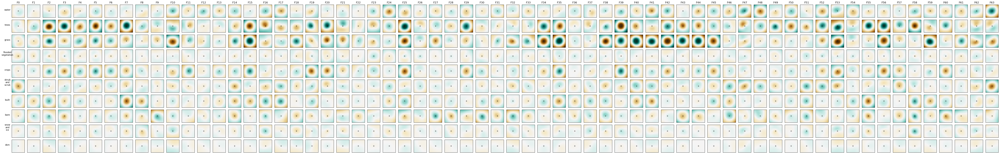

In [ ]:
### PLOT RESULTS ###
save_results = False
# Plot a selection of stas
h_to_plot = len(all_stas)
f_to_plot = 64 # N_features
plt.figure(figsize=(f_to_plot, h_to_plot))
# Color plot borders by average value
# lim = np.nanmax(np.abs(all_stas[:h_to_plot, :f_to_plot]))
# Plot one tuning curve per hypothesis per feature
for row, hyp_stas in enumerate(all_stas[:h_to_plot]):
    for col, sta in enumerate(hyp_stas[:f_to_plot]):
        ax = plt.subplot(h_to_plot, f_to_plot, row * f_to_plot + col + 1)
        vu.plot_sta(sta, ax=ax, lim=0.1)
        if col == 0:
            ax.set_ylabel(names[row].replace('_','\n'), rotation=0, labelpad=20)
        if row == 0:
            ax.set_title(f'F{col}')
plt.tight_layout();
if not load and save_results:
    plt.savefig(os.path.join(base_dir, 'sta_dat.png'))
 

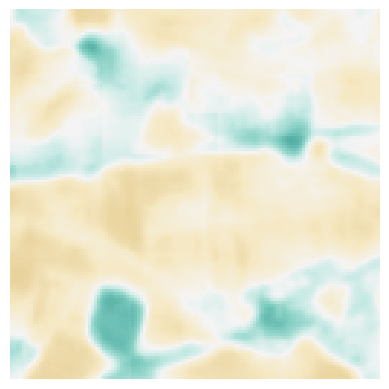

In [6]:
vu.plot_feature(hypotheses[1][1])

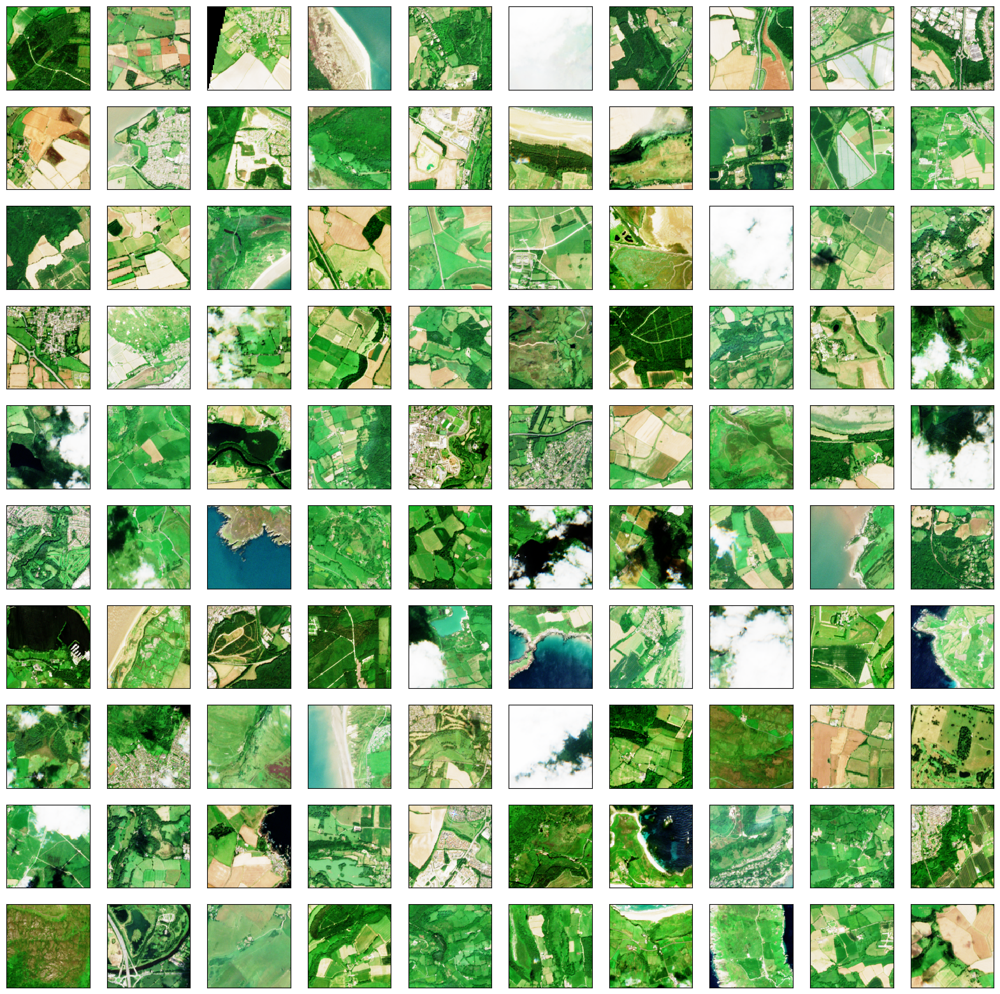

In [7]:
 # Plot the map for a particular feature that you might like across patches
cols=10
rows=int(np.ceil(patches/cols))
curr_f = 0
lim = np.nanmax(np.abs(np.stack(features, axis=-1)[curr_f]))
plt.figure(figsize=(2*cols, 2*rows))
for p, feature in enumerate(features):
    ax = plt.subplot(rows, cols, p + 1)
    vu.plot_sentinel(sentinel_eq[p], ax=ax)

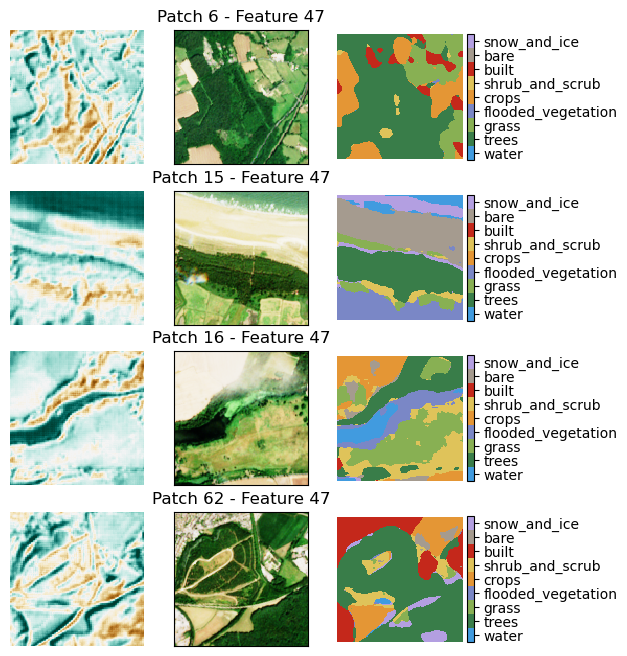

In [31]:
 # Plot the map for a particular feature that you might like across patches
cols = 3
patch_list = [6, 15, 16, 62] # [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47
fig, ax = plt.subplots(nrows=rows, ncols=cols,  figsize=(2*cols, 2*rows))
iplot = 0
for p in patch_list:
    feature = features[p]
    vu.plot_feature(feature[curr_f], ax=ax[iplot,0], lim_zscore=True)
    vu.plot_sentinel(sentinel_eq[p], ax=ax[iplot,1])
    vu.plot_dw_landcover_from_hyp(hypotheses[p], fig=fig, ax=ax[iplot,2])
    ax[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

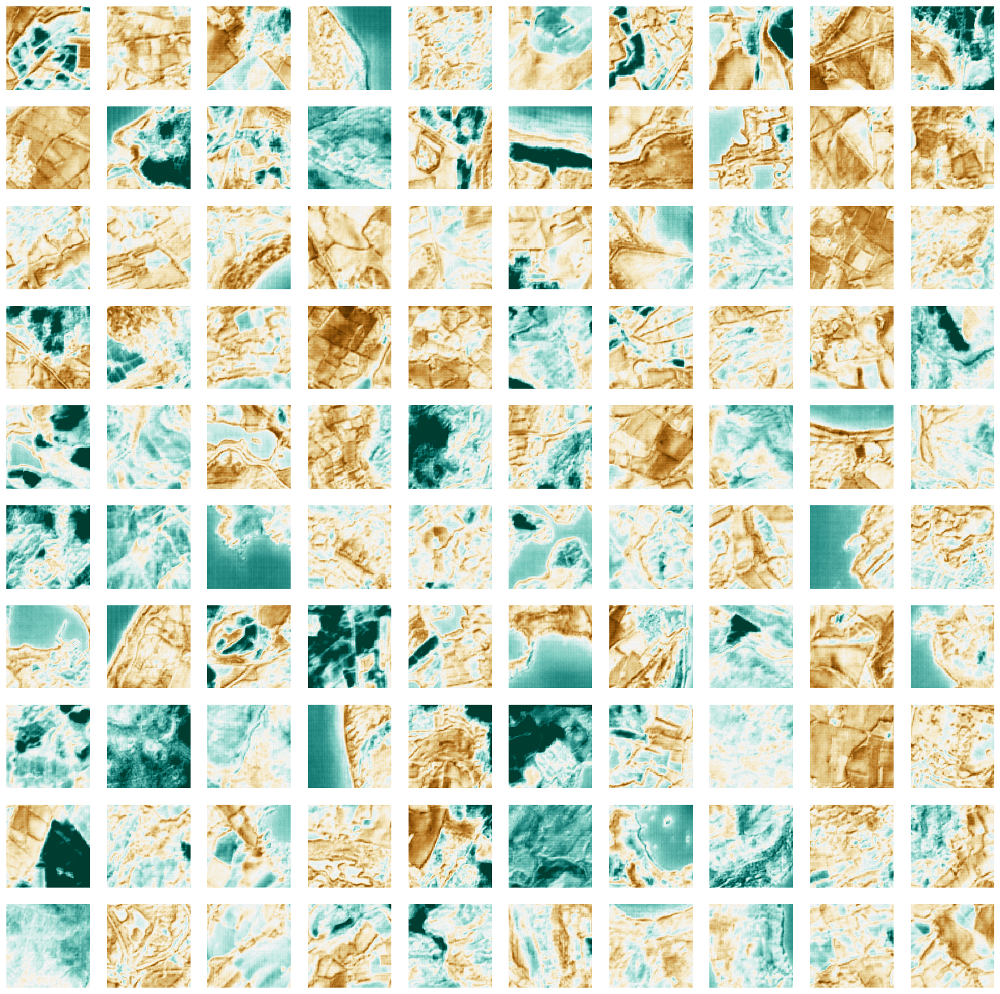

In [32]:
 # Plot the map for a particular feature that you might like across patches
curr_f = 0

cols=10
rows=int(np.ceil(patches/cols))
lim = np.nanmax(np.abs(np.stack(features, axis=-1)[curr_f]))
plt.figure(figsize=(2*cols, 2*rows))
for p, feature in enumerate(features):
    plt.subplot(rows, cols, p + 1)
    vu.plot_feature(feature[curr_f])    

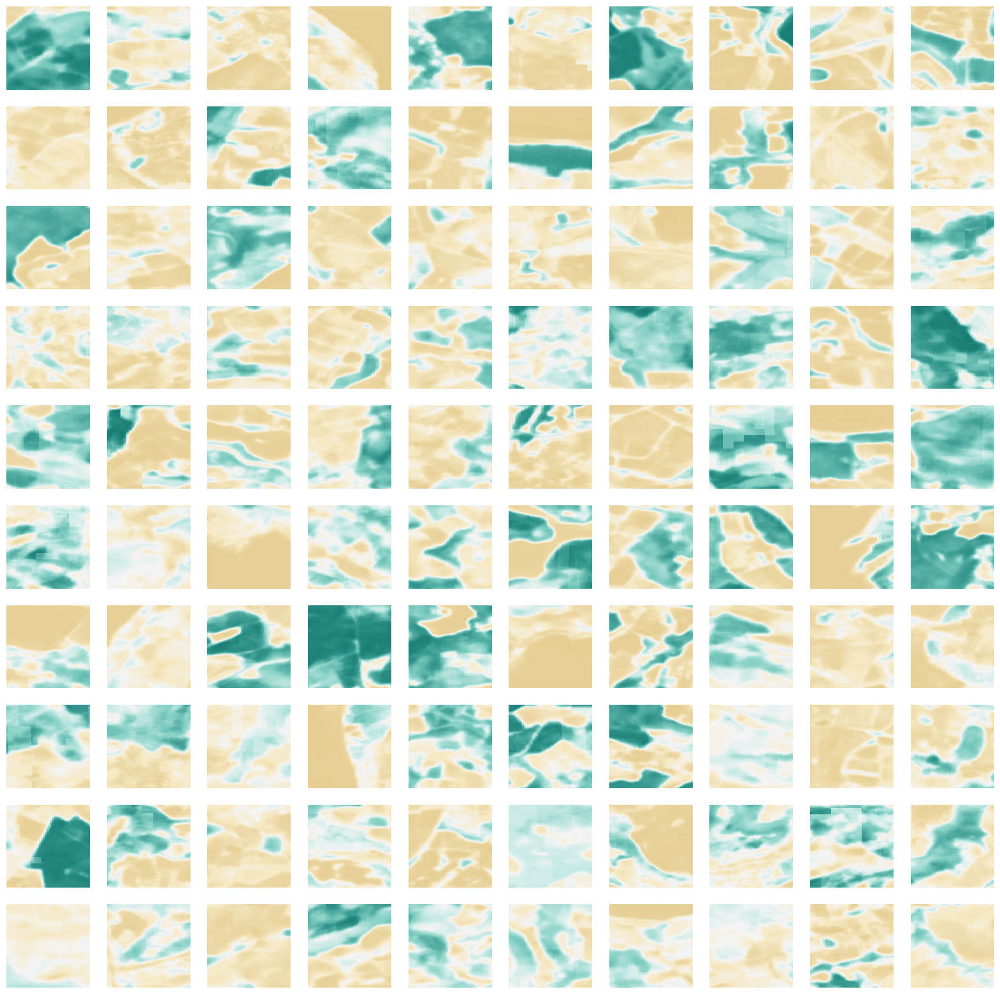

In [19]:
# Plot the map for a particular hypothesis that you might like across patches
curr_h = 1

cols=10
rows=int(np.ceil(patches/cols))

lim = np.nanmax(np.abs(np.stack(hypotheses, axis=-1)[curr_h]))
plt.figure(figsize=(2*cols, 2*rows))
for p, hypothesis in enumerate(hypotheses):
    plt.subplot(rows, cols, p + 1)   
    vu.plot_feature(hypothesis[curr_h])

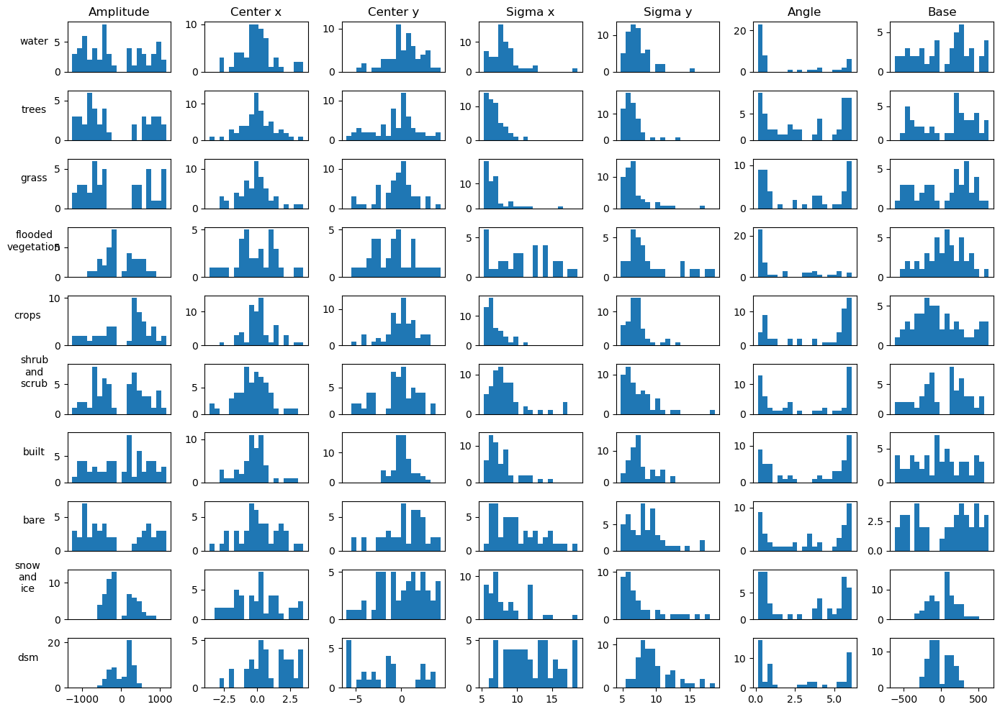

In [12]:
# Make overviews of all parameter histograms
plt.figure(figsize=(2*plot_params.shape[-1], plot_params.shape[0]))
for h, hyp_par in enumerate(plot_params):
    for p, (p_name, p_bins) in enumerate(zip(param_names, param_bins)):
        ax = plt.subplot(plot_params.shape[0], plot_params.shape[-1], h*plot_params.shape[-1] + p + 1)
        plt.hist(hyp_par[:,p], p_bins)
        if p == 0:
            ax.set_ylabel(names[h].replace('_','\n'), rotation=0, labelpad=20)
        if h == 0:
            ax.set_title(p_name)
        if h < plot_params.shape[0] - 1:
            ax.set_xticks([])
plt.tight_layout()
if not load:
    plt.savefig(os.path.join(base_dir, 'sta_par.png'))      

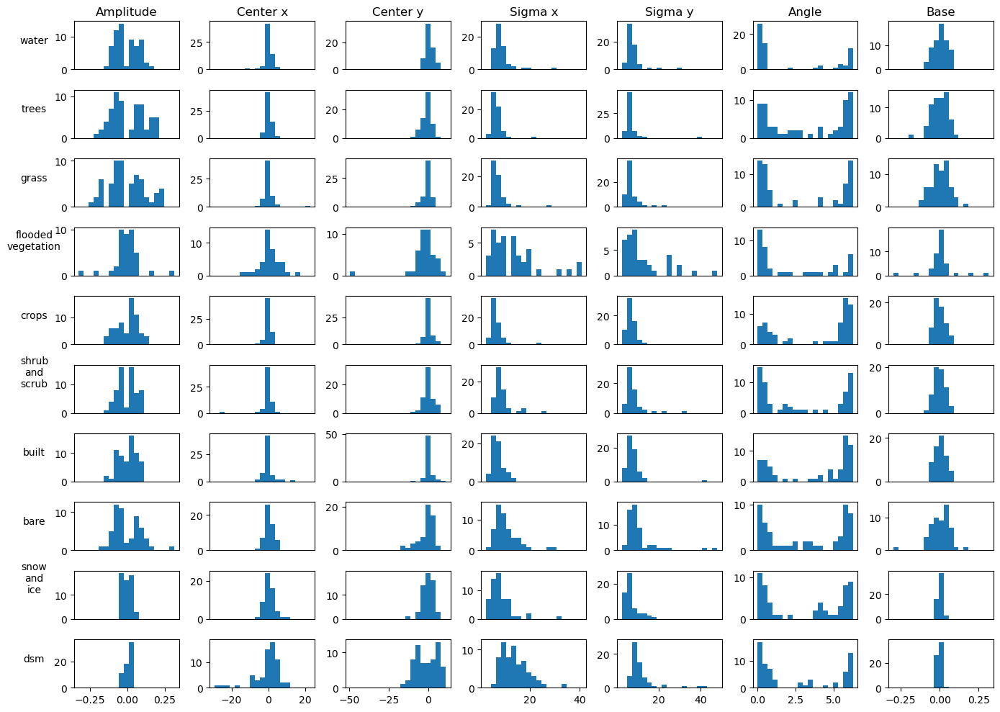

In [47]:

# Repeat for features with reasonable peak locations and sigmas
# This avoids fits where the sta is effectively a horizontal/vertical gradient
# so you need a huge gaussian (large radius, large amplitude, far away) to fit it

param_bins = [np.linspace(np.nanmin(filtered_params[:,:,p]), np.nanmax(filtered_params[:,:,p]), 20)
              for p in range(filtered_params.shape[-1])]
plt.figure(figsize=(2*plot_params.shape[-1], plot_params.shape[0]))
for h, hyp_par in enumerate(filtered_params):
    for p, (p_name, p_bins) in enumerate(zip(param_names, param_bins)):
        ax = plt.subplot(plot_params.shape[0], plot_params.shape[-1], h*plot_params.shape[-1] + p + 1)
        plt.hist(hyp_par[:,p], p_bins)
        if p == 0:
            ax.set_ylabel(names[h].replace('_','\n'), rotation=0, labelpad=20)
        if h == 0:
            ax.set_title(p_name)
        if h < plot_params.shape[0] - 1:
            ax.set_xticks([])
plt.tight_layout() 

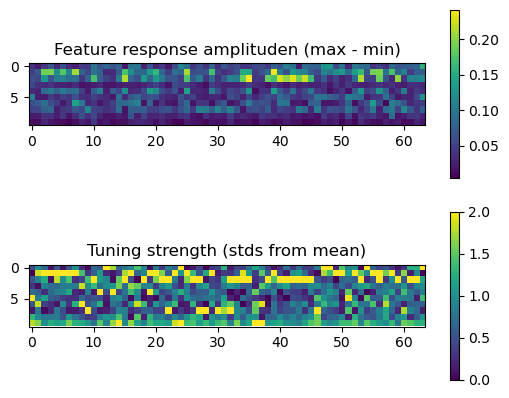

In [52]:

# Calculate tuning strength to each hypothesis for each feature
# It's a pretty rough estimate of tuning: 
# How many stds is one hyp's amplitude from the mean of other hyp amplitudes
tuning_strength = np.zeros((N_hypotheses, N_features))
amp_feat = np.max(all_stas.reshape([N_hypotheses, N_features, -1]), axis=-1) - np.min(all_stas.reshape([N_hypotheses, N_features, -1]), axis=-1)
for h in range(N_hypotheses):
    hyp_self = np.eye(N_hypotheses)[h].astype(np.bool)
    self_amp = amp_feat[h]
    other_mean = np.nanmean(amp_feat[~hyp_self], axis=0)
    other_std = np.nanstd(amp_feat[~hyp_self], axis=0)
    tuning_strength[h,:] = np.abs(self_amp - other_mean) / other_std

# Plot average response and significant tuning
plt.figure()
plt.subplot(2,1,1);
plt.imshow(amp_feat)
plt.colorbar()
plt.title('Feature response amplituden (max - min)')

plt.subplot(2,1,2);
plt.imshow(tuning_strength, vmin=0, vmax=2)
plt.colorbar()
plt.title('Tuning strength (stds from mean)');

Text(0.5, 1.0, 'F8 map')

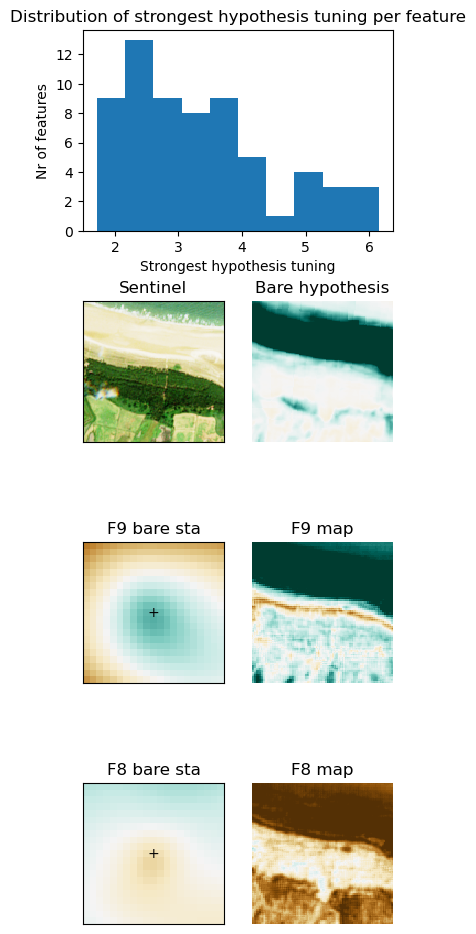

In [54]:
feat1, feat2 = 9, 8

# Plot distribution of strongest tuning across features
sta_lim = np.nanmax(np.abs(all_stas))
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(np.max(tuning_strength, axis=0));
plt.xlabel('Strongest hypothesis tuning')
plt.ylabel('Nr of features')
plt.title('Distribution of strongest hypothesis tuning per feature')

# Plot a strongly tuned example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[15], ax=ax)
plt.title('Sentinel')

ax =plt.subplot(4,2,4);
vu.plot_feature(hypotheses[15][7], ax=ax)
plt.title('Bare hypothesis')

# Plot the feature that shows strong bare tuning
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[7,feat1], ax=ax)
plt.title(f'F{feat1} bare sta')

ax = plt.subplot(4,2,6)
vu.plot_feature(features[15][feat1], ax=ax)
plt.title(f'F{feat1} map')

# Plot the feature that shows weak bare tuning
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[7,feat2], ax=ax)
plt.title(f'F{feat2} bare sta')

ax = plt.subplot(4,2,8)
vu.plot_feature(features[15][feat2], ax=ax)
plt.title(f'F{feat2} map')

Text(0.5, 1.0, 'F19 map')

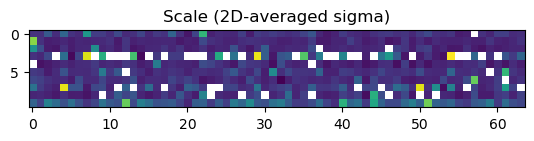

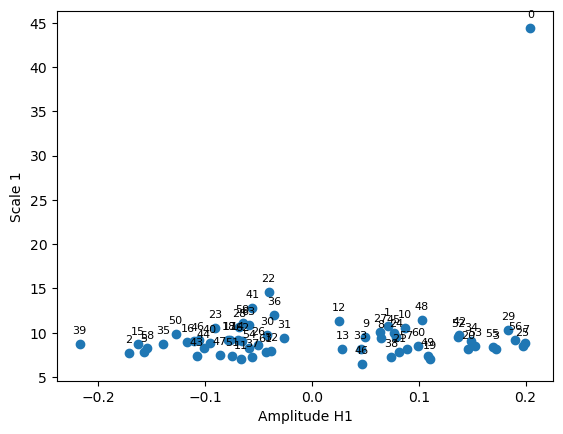

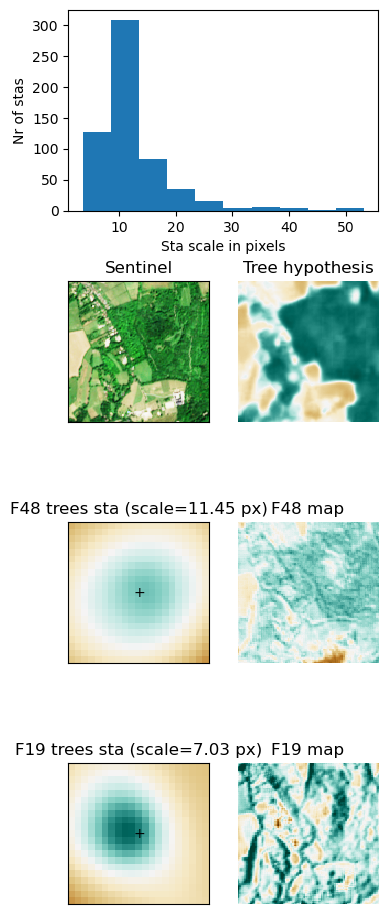

In [60]:
feat1, feat2 = 48, 19
ind_h = 1
ind_patch = 4
# Calculate scale: average between x and y sigma, only from reasonable fits
# scale = np.mean(filtered_params[:,:,3:5], axis=-1)
scale = np.sqrt(filtered_params[:,:,3] ** 2 + filtered_params[:,:,4] ** 2)
plt.figure()
plt.imshow(scale)
plt.title('Scale (2D-averaged sigma)')

plt.figure()
ampl_h = filtered_params[ind_h, ...][:, 0]
scale_h = scale[ind_h, ...]

# plot points (skip nan)
valid = np.isfinite(ampl_h) & np.isfinite(scale_h)
plt.plot(ampl_h[valid], scale_h[valid], 'o')
plt.xlabel(f'Amplitude H{ind_h}')
# annotate each plotted point with its index above the marker
for i, (x, y) in enumerate(zip(ampl_h, scale_h)):
    if not (np.isfinite(x) and np.isfinite(y)):
        continue
    plt.annotate(str(i), xy=(x, y), xytext=(0, 6), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.ylabel(f'Scale {ind_h}')

# Plot scale across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(scale[sta_to_plot]);
plt.xlabel('Sta scale in pixels')
plt.ylabel('Nr of stas')

# Plot a short and long scale example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
vu.plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title('Tree hypothesis')

# Plot the feature with short scale
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title(f'F{feat1} trees sta (scale={scale[ind_h,feat1]:.2f} px)')

ax = plt.subplot(4,2,6);
vu.plot_feature(features[ind_patch][feat1], ax=ax)
plt.title(f'F{feat1} map')

# Plot the feature with long scale
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title(f'F{feat2} trees sta (scale={scale[ind_h,feat2]:.2f} px)')

ax = plt.subplot(4,2,8);
vu.plot_feature(features[ind_patch][feat2], ax=ax)
plt.title(f'F{feat2} map')

In [71]:
displacement

array([[2.41318197e+00, 6.72066980e+00, 4.83478696e+00, 2.14350897e+00,
        1.20686869e+01, 9.16665426e-01, 3.41586412e+00, 6.96155884e+00,
        6.93010718e+00, 5.05909094e+00, 1.15415282e+00, 8.54726859e-01,
        1.29617495e+00, 8.15091509e-01, 3.85432463e-01, 4.36000478e+00,
        8.45024046e-01, 6.31456411e-01, 4.78487993e+00, 2.86193286e+00,
        4.05488778e+00, 5.19341890e+00, 4.81819949e+00, 1.34771263e+00,
        1.11401611e+00, 2.96758498e+00, 2.85700339e+00, 7.93286942e-01,
        2.85200097e+00, 1.76272545e+00, 1.53868373e+00, 2.25249670e-01,
        3.27900830e+00, 7.53520155e-01, 2.94591967e+00, 3.28147971e+00,
        5.75755994e-01, 4.57810411e+00, 1.99490517e+00, 1.55456962e+00,
        5.92122012e-01, 1.33726606e+00, 5.86733864e-01, 6.58106672e+00,
        9.17970501e-01, 6.60242549e-01, 1.07399884e+00, 1.60987064e+00,
        9.38626908e-01, 3.51918183e+00, 5.22205223e-01, 4.26126677e+00,
        5.31544479e-01, 2.87599093e+00, 2.04215049e+00, 2.387475

Text(0.5, 1.0, 'F63 map')

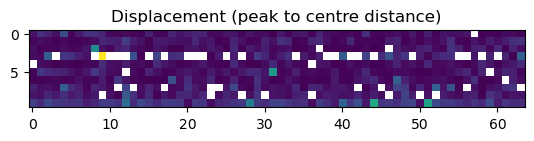

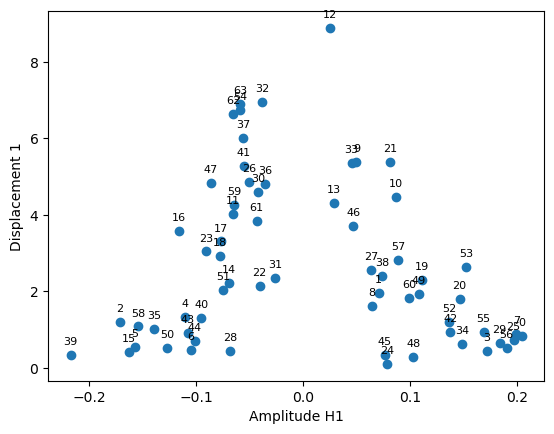

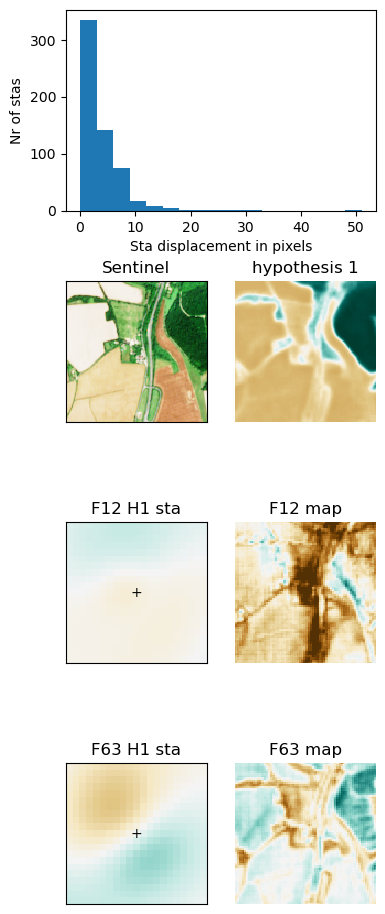

In [103]:
feat1, feat2 = 12, 63
ind_h = 1
ind_patch = 7

# Calculate displacement: peak to center distance
displacement = np.sqrt(filtered_params[:,:,1]**2 + filtered_params[:,:,2]**2)
plt.figure()
plt.imshow(displacement)
plt.title('Displacement (peak to centre distance)')

plt.figure()
ampl_h = filtered_params[ind_h, ...][:, 0]
displacement_h = displacement[ind_h, ...]

# plot points (skip nan)
valid = np.isfinite(ampl_h) & np.isfinite(displacement_h)
plt.plot(ampl_h[valid], displacement_h[valid], 'o')
plt.xlabel(f'Amplitude H{ind_h}')
# annotate each plotted point with its index above the marker
for i, (x, y) in enumerate(zip(ampl_h, displacement_h)):
    if not (np.isfinite(x) and np.isfinite(y)):
        continue
    plt.annotate(str(i), xy=(x, y), xytext=(0, 6), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.ylabel(f'Displacement {ind_h}')

# Plot displacement across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(displacement[sta_to_plot], bins=np.arange(0, np.nanmax(displacement[sta_to_plot])+1, 3));
plt.xlabel('Sta displacement in pixels')
plt.ylabel('Nr of stas')

# Plot a short and long scale example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
vu.plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title(f'hypothesis {ind_h}')

# Plot the feature with small displacement
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title(f'F{feat1} H{ind_h} sta')
ax = plt.subplot(4,2,6);
vu.plot_feature(features[ind_patch][feat1], ax=ax)
plt.title(f'F{feat1} map')
# Plot the feature with large displacement
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title(f'F{feat2} H{ind_h} sta')

ax = plt.subplot(4,2,8);
vu.plot_feature(features[ind_patch][feat2], ax=ax)
plt.title(f'F{feat2} map')

Text(0.5, 1.0, 'F49 map')

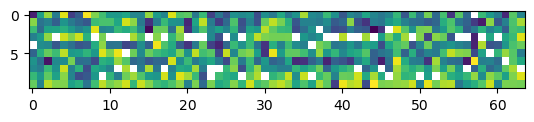

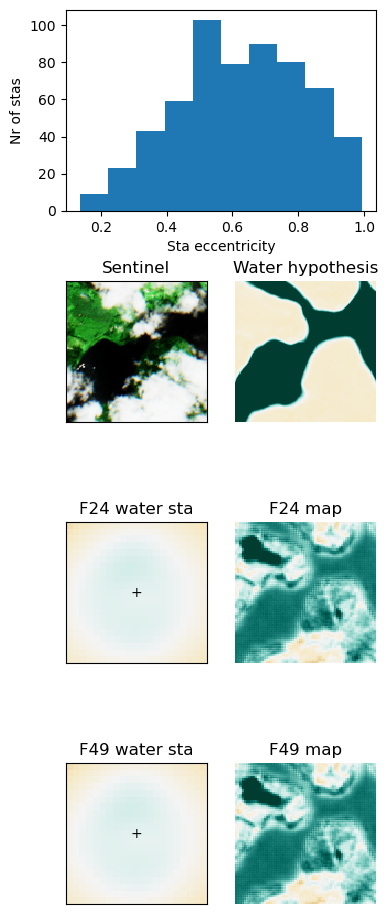

In [68]:
ind_h = 0
ind_patch = 55

# Calculate symmetry: eccentricity
a = np.max(filtered_params[:,:,3:5], axis=-1)
b = np.min(filtered_params[:,:,3:5], axis=-1)
eccentricity = np.sqrt(1-(b/a)**2)
plt.figure()
plt.imshow(eccentricity)

feat1, feat2 = np.argmin(eccentricity[ind_h,:]), np.argmax(eccentricity[ind_h,:])

# Plot eccentricity across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(eccentricity[sta_to_plot]);
plt.xlabel('Sta eccentricity')
plt.ylabel('Nr of stas')
# Plot a short and long scale example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
vu.plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title('Water hypothesis')

# Plot the feature with small eccentricity
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title('F24 water sta')

ax = plt.subplot(4,2,6);
vu.plot_feature(features[ind_patch][feat1], ax=ax)
plt.title('F24 map')

# Plot the feature with large eccentiricty
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title('F49 water sta')

ax = plt.subplot(4,2,8);
vu.plot_feature(features[ind_patch][feat2], ax=ax)
plt.title('F49 map')

# Fig 2

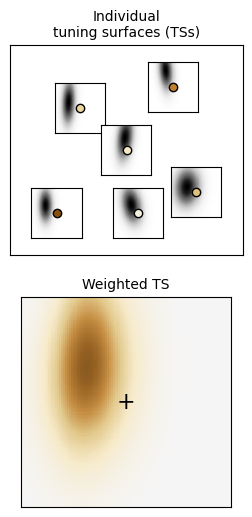

In [42]:
vu.plot_sta_example()

/Users/tplas/repos/NeurEO/notebooks/../src/vis_utils.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  import data_utils as du
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.047..1.5].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.024..1.5].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0195..1.263].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.034..1.5].


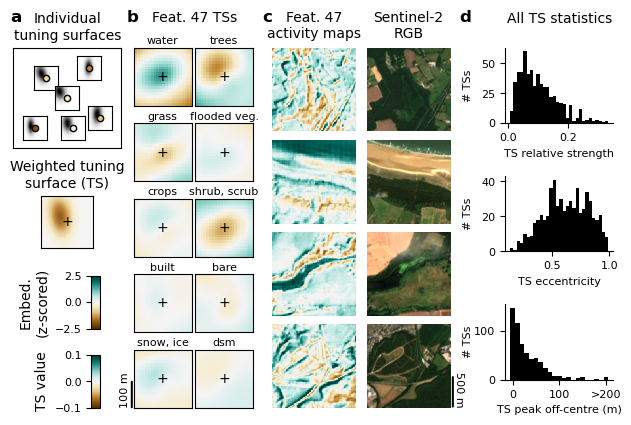

In [ ]:
save_fig = False

patch_list = [6, 15, 16, 62] # [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47

fig = plt.figure(figsize=(6, 4))
gs_topleft = fig.add_gridspec(nrows=1, ncols=1, left=0.0, right=0.18, bottom=0.65, top=0.9)
ax_topleft = gs_topleft.subplots()
gs_middleleft = fig.add_gridspec(nrows=1, ncols=1, left=0.04, right=0.14, bottom=0.4, top=0.53)
ax_middleleft = gs_middleleft.subplots()
gs_cbar_bottomleft = fig.add_gridspec(nrows=2, ncols=1, left=0.13, right=0.145, bottom=0, top=0.33, hspace=0.5)
ax_cbar_bottomleft = gs_cbar_bottomleft.subplots()
gs_left = fig.add_gridspec(nrows=5, ncols=2, left=0.2, right=0.4, bottom=0, top=0.9, wspace=0.05, hspace=0.3)
ax_left = gs_left.subplots()
gs_middle = fig.add_gridspec(nrows=len(patch_list), ncols=2, left=0.43, right=0.73, bottom=0, top=0.9, wspace=0.1, hspace=0.1)
ax_middle = gs_middle.subplots()
gs_right = fig.add_gridspec(nrows=3, ncols=1, left=0.82, right=1, bottom=0.07, top=0.9, wspace=0.2, hspace=0.7)
ax_right = gs_right.subplots()

## Example
vu.plot_sta_example(ax_top=ax_topleft, ax_bottom=ax_middleleft)

## STAs:
ax_left = ax_left.flatten()
stas_feat = np.squeeze(all_stas[:, curr_f, :, :])
h_names = du.get_hyp_names()
h_names = [h.replace('flooded_vegetation', 'flooded veg.').replace('shrub_and_scrub', 'shrub, scrub').replace('snow_and_ice', 'snow, ice') for h in h_names]
for iplot, ax in enumerate(ax_left):
    vu.plot_sta(stas_feat[iplot], ax=ax, plot_cbar=(iplot==8), 
                cax=ax_cbar_bottomleft[1] if iplot==8 else None,
                lim=0.1, add_centre=True)
    ax.set_title(f'{h_names[iplot].replace('_', ' ')}', fontsize=8, y=0.92)

vu.add_scalebar(ax=ax_left[-2], location='bottom left vertical', fraction=0.1 / 0.21, label='100 m', offset=0.04, fontsize=8, text_offset=-1)

## Example patches:
iplot = 0
for p in patch_list:
    feature = features[p]
    # feature = features_nonzscored[p]
    vu.plot_feature(feature[curr_f], ax=ax_middle[iplot][0], plot_cbar=(iplot==0), cax=ax_cbar_bottomleft[0], lim_zscore=True)
    # vu.plot_sentinel(sentinel_eq[p], ax=ax_middle[iplot][1])
    ax_middle[iplot][1].imshow(np.clip(np.swapaxes(np.swapaxes(sentinel[p][:3], 0, 2), 0, 1), 0, 3000) / 2000)
    vu.naked(ax=ax_middle[iplot][1])
    # plot_dw_landcover_from_hyp(hypotheses[p], ax=ax[iplot,2], plot_cbar=(iplot==0))
    # ax_middle[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

vu.add_scalebar(ax=ax_middle[-1][1], location='bottom right vertical', fraction=0.5 / 1.28, label='500 m', fontsize=8)

## set fontsize ticks cbars:
for ax in ax_cbar_bottomleft:
    ax.tick_params(axis='both', which='major', labelsize=8)

## Statistics:
# Tuning strength histogram
ax = ax_right[0]
amp_feat = np.max(np.abs(all_stas.reshape([N_hypotheses, N_features, -1])), axis=-1)
amp_feat_rel = amp_feat / amp_feat.sum(axis=0, keepdims=True)
    
ax.hist(np.ravel(amp_feat_rel[sta_to_plot]), bins=30, color='k')
# ax.hist(np.max(tuning_strength, axis=0), bins=20, color='k')
ax.set_xlabel('TS relative strength', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8, labelpad=1)
ax.tick_params(axis='both', which='major', labelsize=8)
vu.despine(ax=ax)

## Eccentricity histogram
ax = ax_right[1]
a = np.max(filtered_params[:,:,3:5], axis=-1)
b = np.min(filtered_params[:,:,3:5], axis=-1)
eccentricity = np.sqrt(1-(b/a)**2)

ax.hist(eccentricity[sta_to_plot], bins=30, color='k')
ax.set_xlabel('TS eccentricity', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8, labelpad=1)
ax.tick_params(axis='both', which='major', labelsize=8)
vu.despine(ax=ax)

ax = ax_right[2]
# ax.hist(np.ravel(filtered_params[:, :, 3] - filtered_params[:, :, 4]), bins=30, color='k')
displacement = np.sqrt(filtered_params[:,:,1]**2 + filtered_params[:,:,2]**2) * 10  # in meters
counts, bins = np.histogram(displacement, bins=np.concatenate((np.arange(0, 210, 10), [10000])))
ax.bar(bins[:-1], counts, width=10, color='k')
# ax.hist(displacement[sta_to_plot], bins=30, color='k')
# ax.set_xlabel(r"$\sigma_x - \sigma_y$", fontsize=8)
ax.set_xticks([0, 100, 200])
ax.set_xticklabels(['0', '100', '>200'])
ax.set_xlabel('TS peak off-centre (m)', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8, labelpad=1)
ax.tick_params(axis='both', which='major', labelsize=8)
vu.despine(ax=ax)


sys.path.append('/Users/tplas/repos/reproducible_figures/scripts')
import rep_fig_vis as rfv
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='a', x_offset=0.08, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='b', x_offset=1.16, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='c', x_offset=2.4, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='d', x_offset=4.24, y_offset=0.23, fontsize=12)

ax_left[0].annotate('Feat. 47 TSs', xy=(1.05, 1.45), xycoords='axes fraction', ha='center', fontsize=10)
ax_middle[0][0].annotate('Feat. 47\nactivity maps', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)
ax_middle[0][1].annotate('Sentinel-2\nRGB', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)
ax_right[0].annotate('All TS statistics\n', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)

fig.align_ylabels(ax_cbar_bottomleft)
fig.align_ylabels(ax_right)

if save_fig:
    fig.savefig('../figs/fig2.pdf', bbox_inches='tight')
    plt.savefig('../../ms_neureo/figs/fig2.pdf', bbox_inches='tight')